## PROBLEM STATEMENT

#### Prediction of bankruptcy is a phenomenon of increasing interest to firms who stand to loose money because on unpaid debts. Since computers can store huge dataset pertaining to bankruptcy making accurate predictions from them before hand is becoming important.

#### The data were collected from the Taiwan Economic Journal for the years 1999 to 2009. Company bankruptcy was defined based on the business regulations of the Taiwan Stock Exchange.

#### In this project you will use various classification algorithms on bankruptcy dataset to predict bankruptcies with satisfying accuracies long before the actual event

In [1]:
# importing all libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split # splitting the dataaset
from sklearn.preprocessing import MinMaxScaler


In [2]:
# loading the dataset
company_data=pd.read_csv("C:/Users/Lenovo/Desktop/COMPANY BANKRUPTCY PREDICTION CAPSTONE/COMPANY BANKRUPTCY PREDICTION.csv")

In [3]:
# understanding thr data
company_data.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [4]:
company_data.tail()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009
6818,0,0.493053,0.570105,0.549548,0.627409,0.627409,0.998080,0.801987,0.813800,0.313415,...,0.815956,0.000707,0.626680,0.627408,0.841019,0.275114,0.026793,0.565167,1,0.233902


In [5]:
company_data.columns.values

array(['Bankrupt?',
       ' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax',
       ' Operating Gross Margin', ' Realized Sales Gross Margin',
       ' Operating Profit Rate', ' Pre-tax net Interest Rate',
       ' After-tax net Interest Rate',
       ' Non-industry income and expenditure/revenue',
       ' Continuous interest rate (after tax)', ' Operating Expense Rate',
       ' Research and development expense rate', ' Cash flow rate',
       ' Interest-bearing debt interest rate', ' Tax rate (A)',
       ' Net Value Per Share (B)', ' Net Value Per Share (A)',
       ' Net Value Per Share (C)',
       ' Persistent EPS in the Last Four Seasons', ' Cash Flow Per Share',
       ' Revenue Per Share (Yuan ¥)',
       ' Operating Profit Per Share (Yuan ¥)',
       ' Per Share Net profit before tax (Yuan ¥)',
       ' Realized Sales Gross Profit Growth Rate',
       ' Op

In [6]:
company_data.shape

(6819, 96)

In [7]:
company_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Bankrupt?                                                 6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2    ROA(A) before interest and % after tax                   6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4    Operating Gross Margin                                   6819 non-null   float64
 5    Realized Sales Gross Margin                              6819 non-null   float64
 6    Operating Profit Rate                                    6819 non-null   float64
 7    Pre-tax net Interest Rate                                6819 non-null   float64
 8    After-tax net Int

In [8]:
# checking the null or missing values 
company_data.isnull().sum()

Bankrupt?                                                   0
 ROA(C) before interest and depreciation before interest    0
 ROA(A) before interest and % after tax                     0
 ROA(B) before interest and depreciation after tax          0
 Operating Gross Margin                                     0
                                                           ..
 Liability to Equity                                        0
 Degree of Financial Leverage (DFL)                         0
 Interest Coverage Ratio (Interest expense to EBIT)         0
 Net Income Flag                                            0
 Equity to Liability                                        0
Length: 96, dtype: int64

In [9]:
company_data.isna().value_counts().sum()

6819

In [10]:
company_data.duplicated().sum()

0

In [11]:
# understandingg the descriptive summary
company_data.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,...,0.807760,1.862942e+07,0.623915,0.607946,0.840402,0.280365,0.027541,0.565358,1.0,0.047578
std,0.176710,0.060686,0.065620,0.061595,0.016934,0.016916,0.013010,0.012869,0.013601,0.011163,...,0.040332,3.764501e+08,0.012290,0.016934,0.014523,0.014463,0.015668,0.013214,0.0,0.050014
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,9.036205e-04,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,2.085213e-03,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,5.269777e-03,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,9.820000e+09,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000


### univariate Analysis

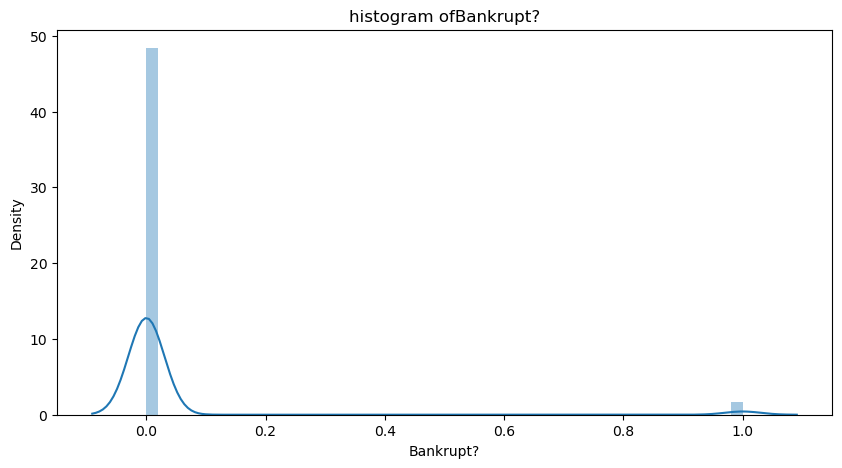

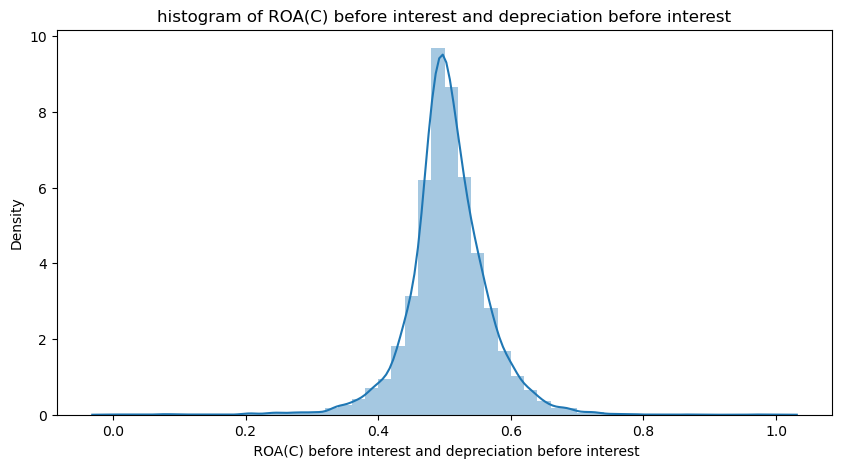

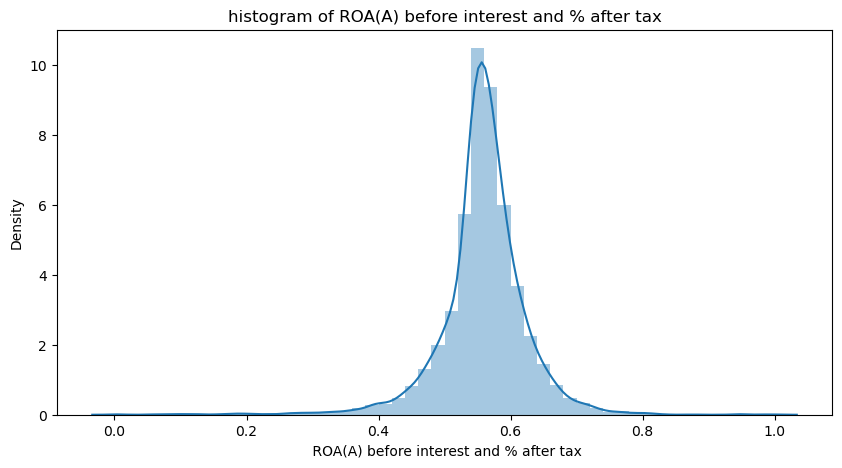

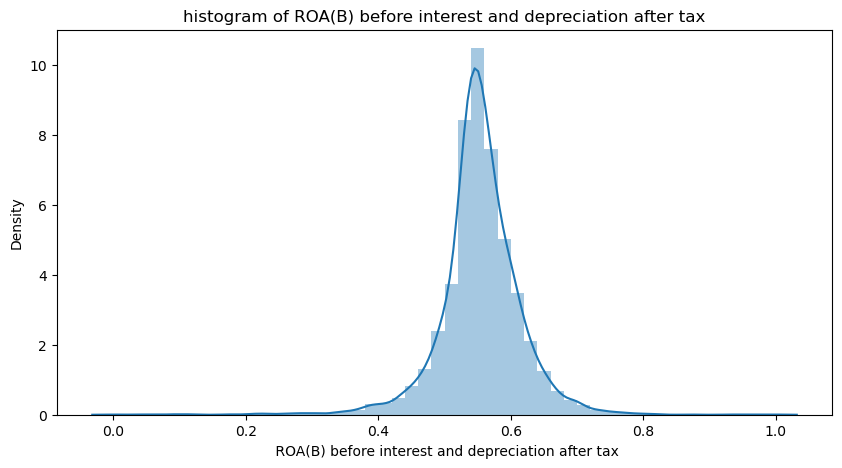

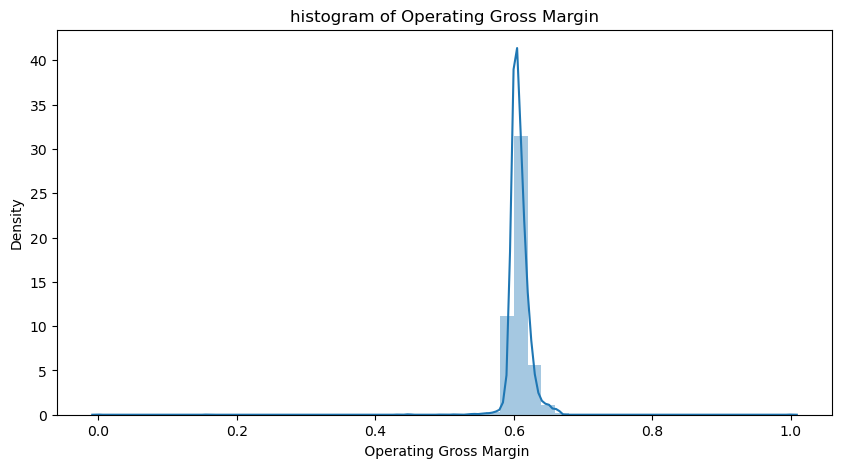

...

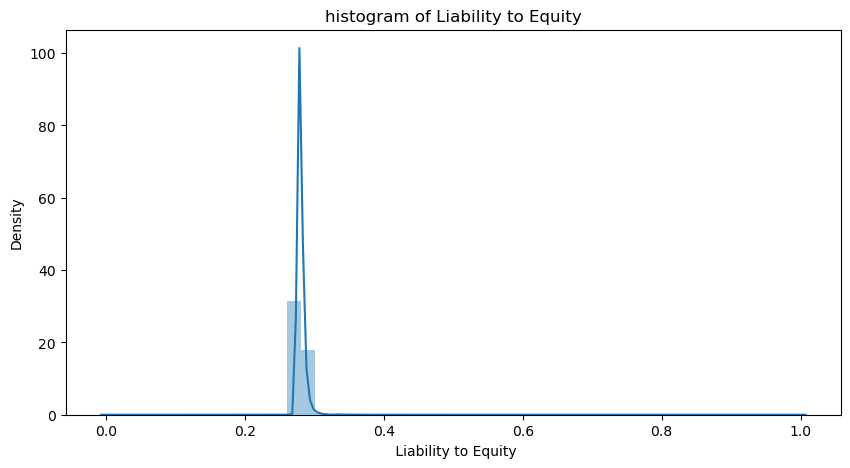

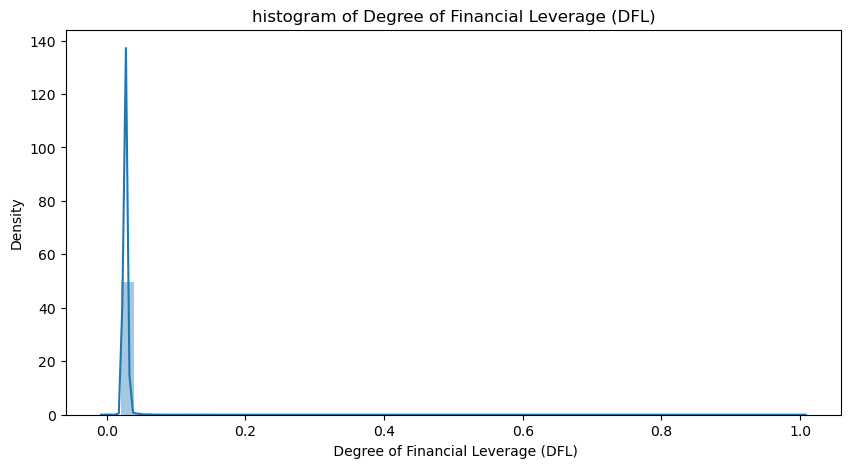

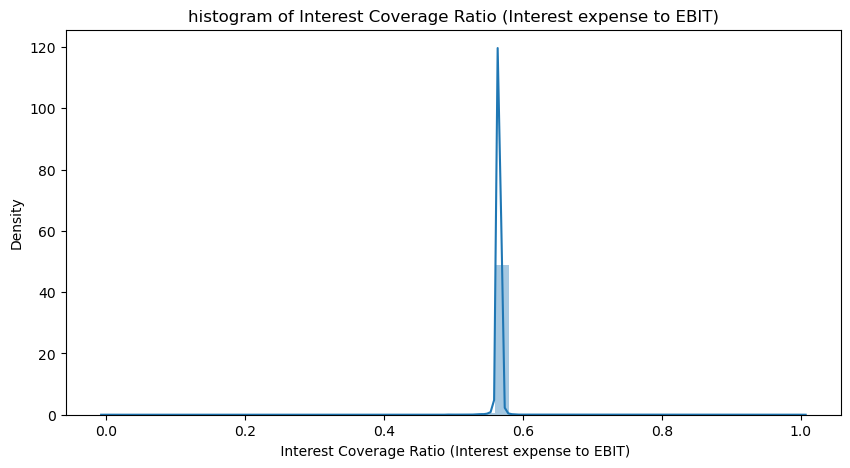

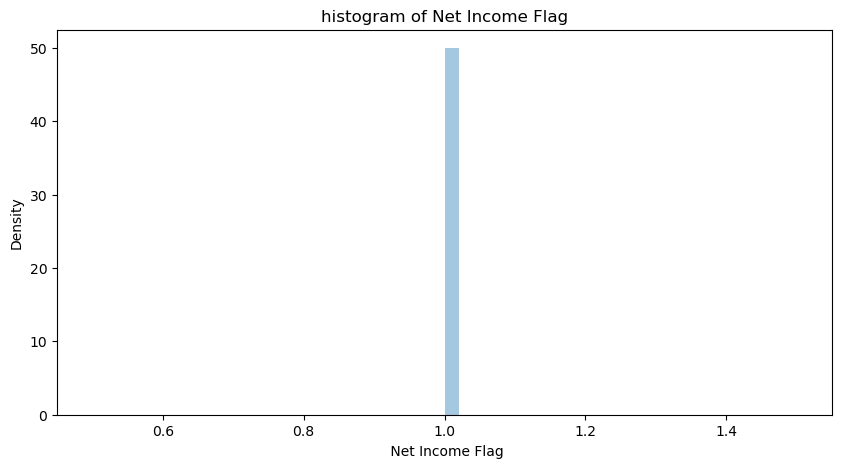

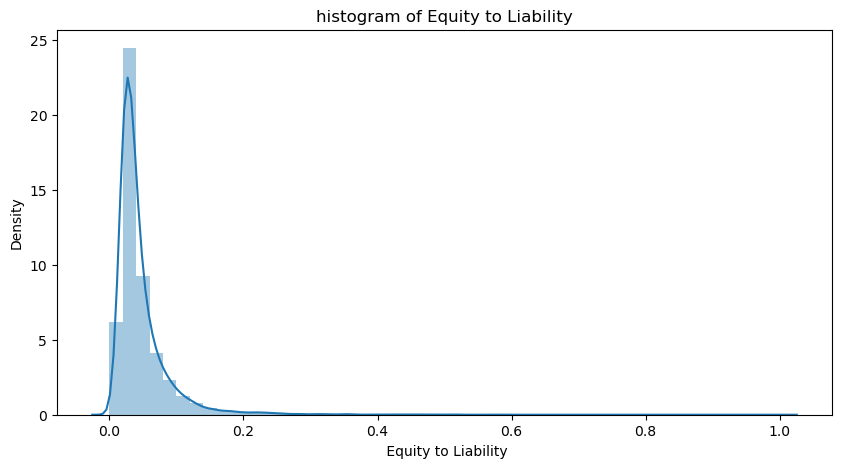

In [12]:
# Understanding each varible with the help of distplot
for i in list(company_data.describe().columns):
  plt.rcParams['figure.figsize'] = (10, 5)
  plt.title('histogram of'+i)
  ax=sns.distplot(company_data[i])
  plt.show()

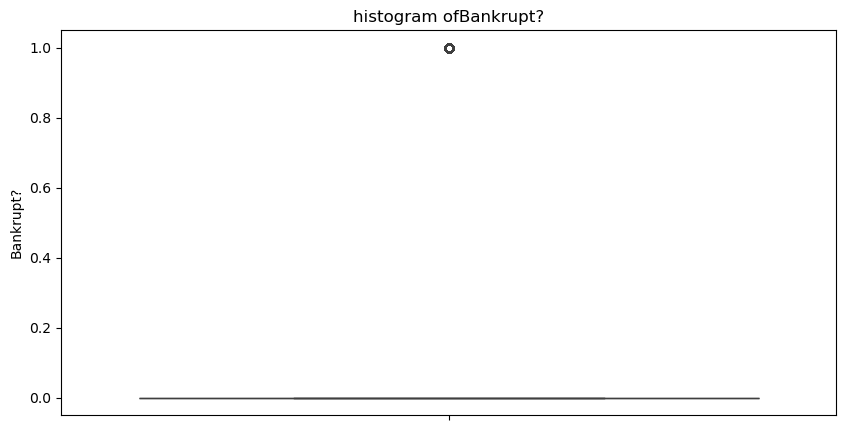

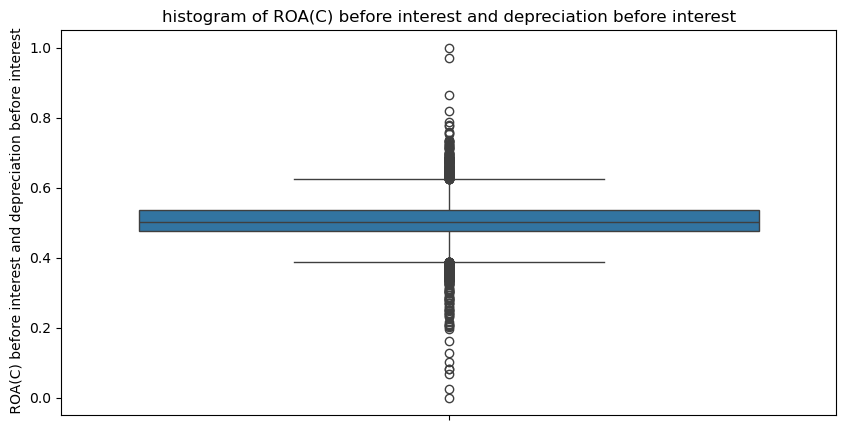

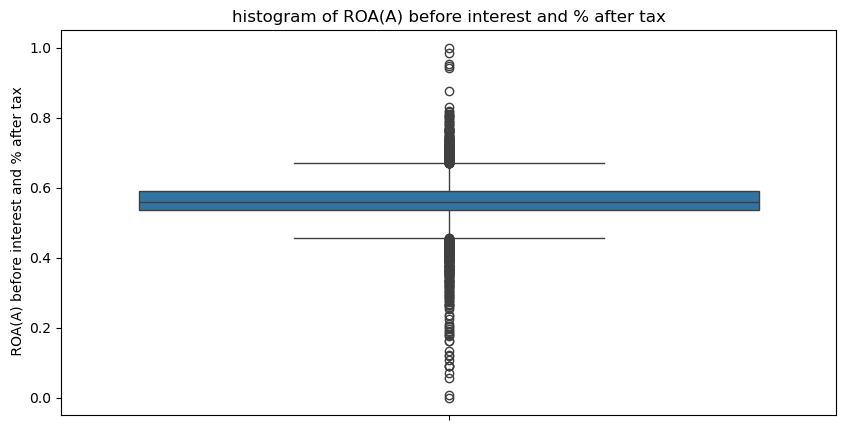

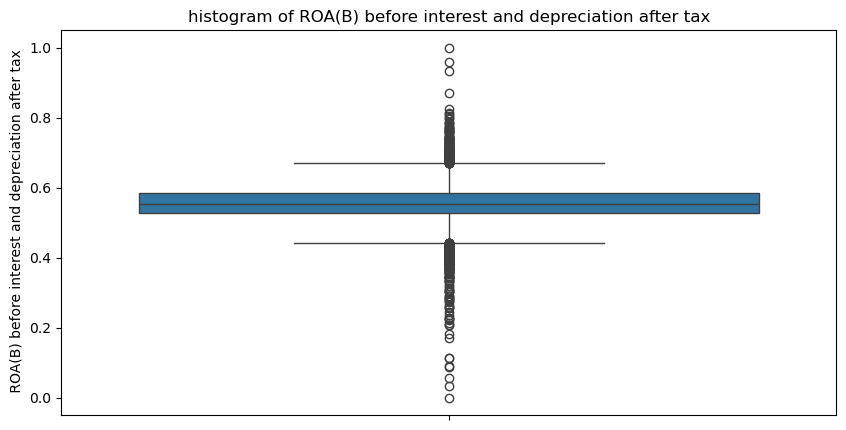

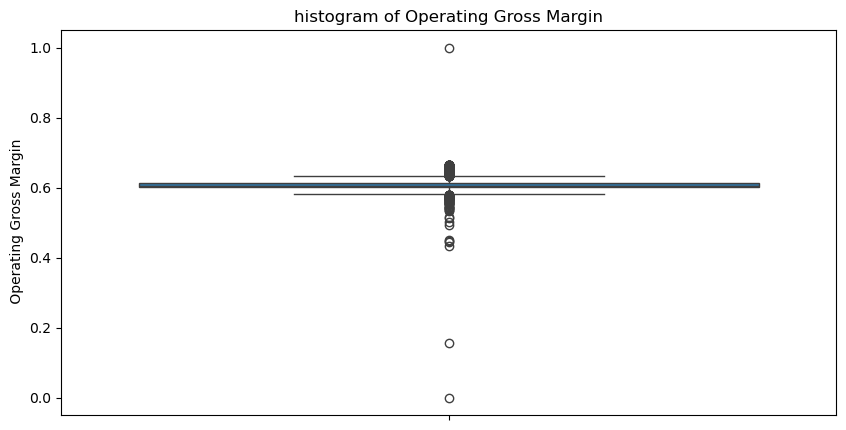

...

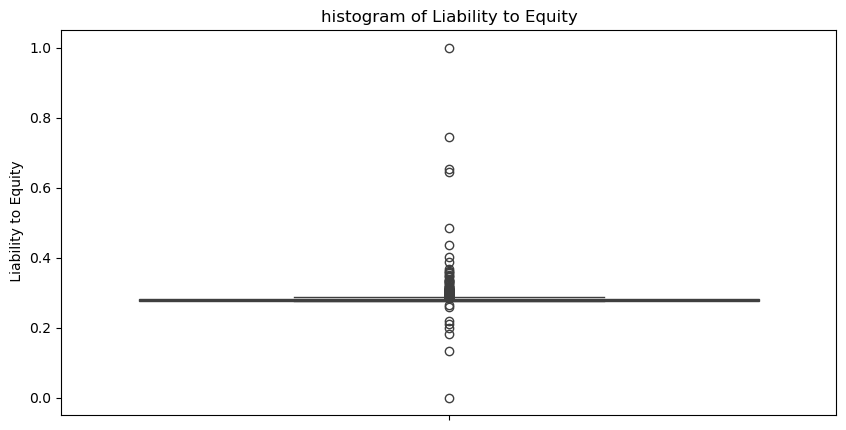

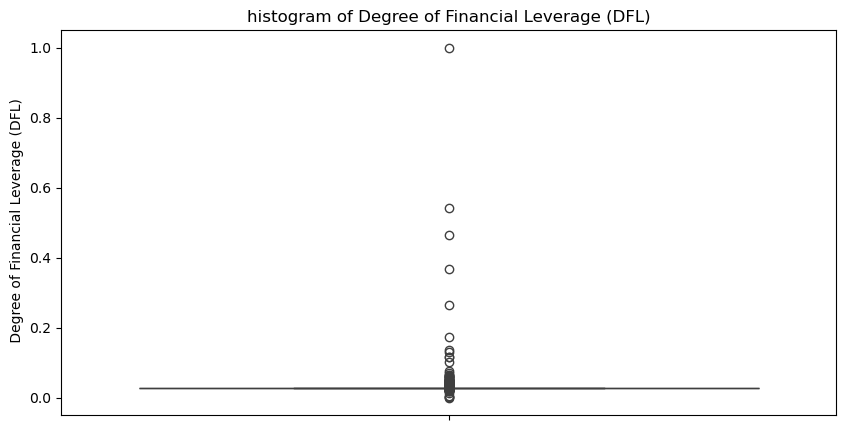

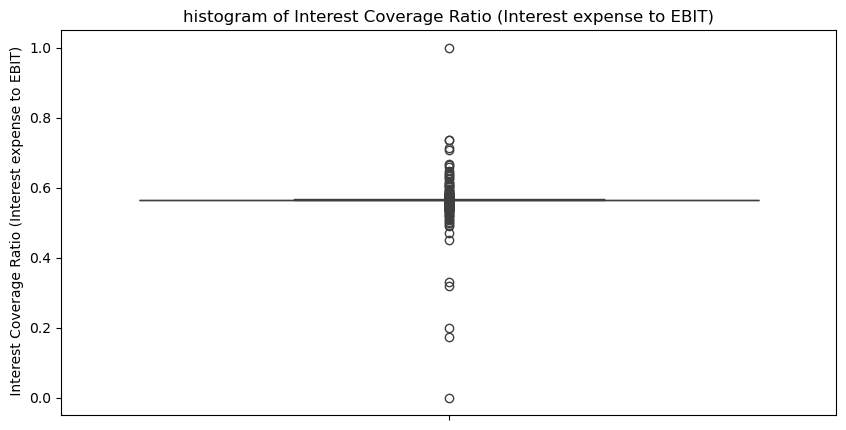

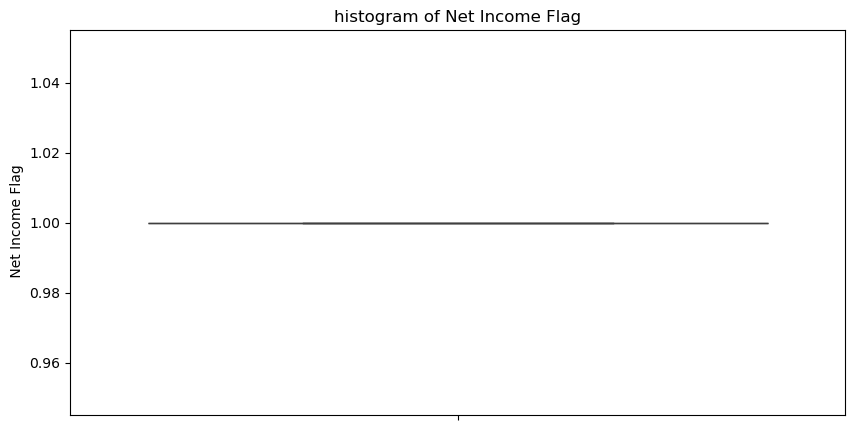

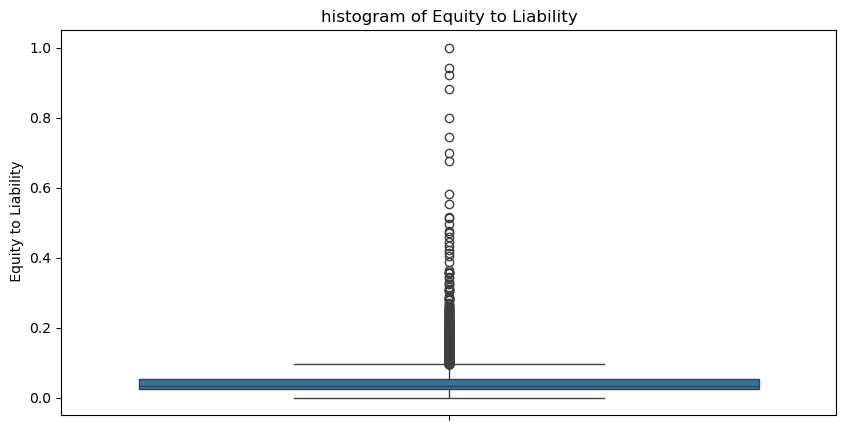

In [13]:
# Understanding each varible with the help of distplot
for i in list(company_data.describe().columns):
  plt.rcParams['figure.figsize'] = (10, 5)
  plt.title('histogram of'+i)
  ax=sns.boxplot(company_data[i])
  plt.show()

## Bivariate Analysis

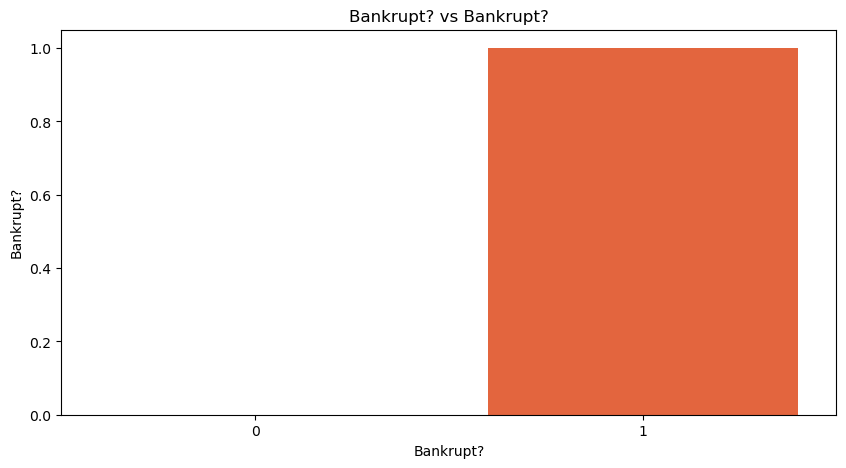

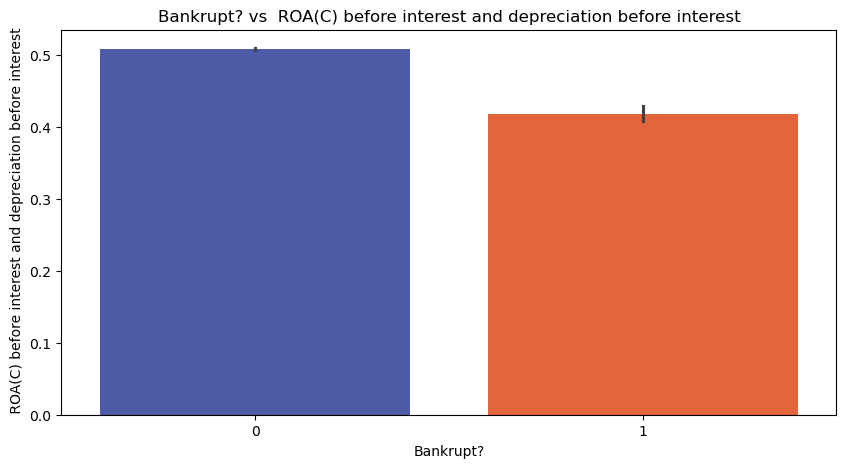

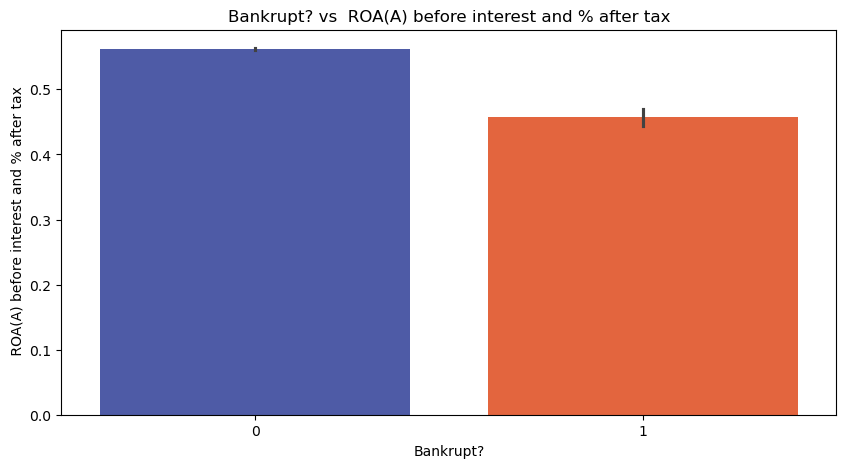

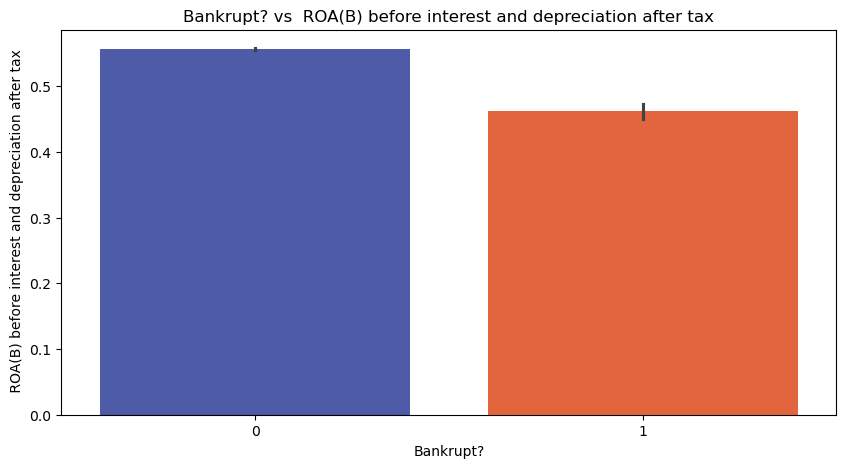

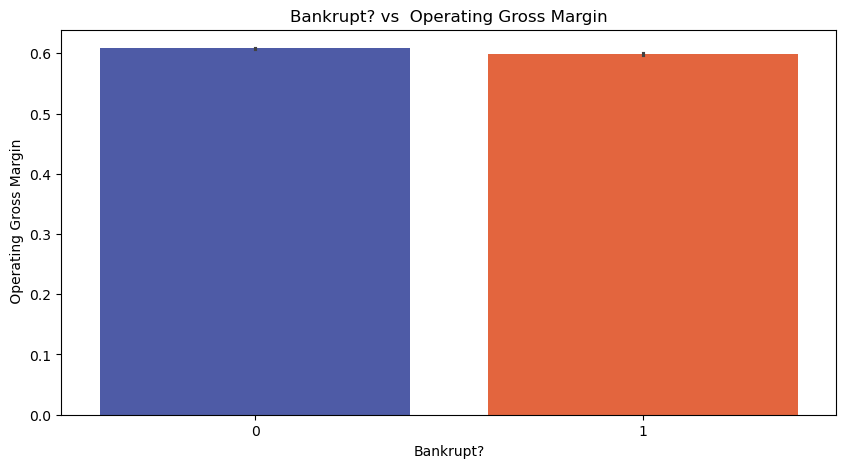

...

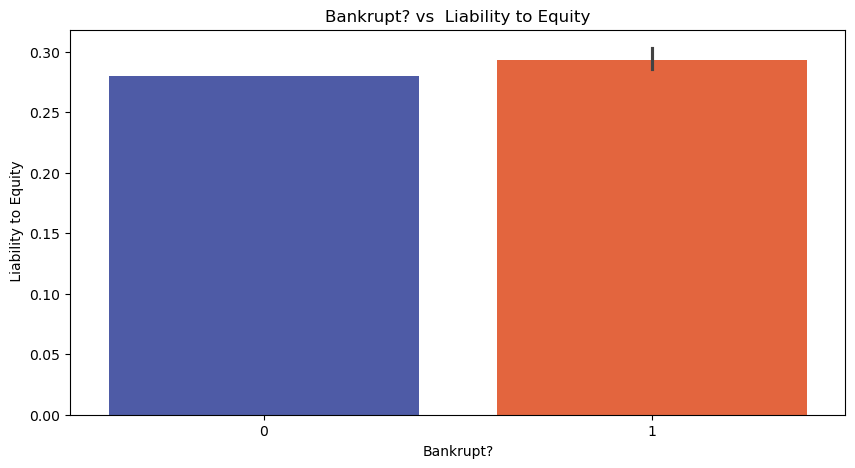

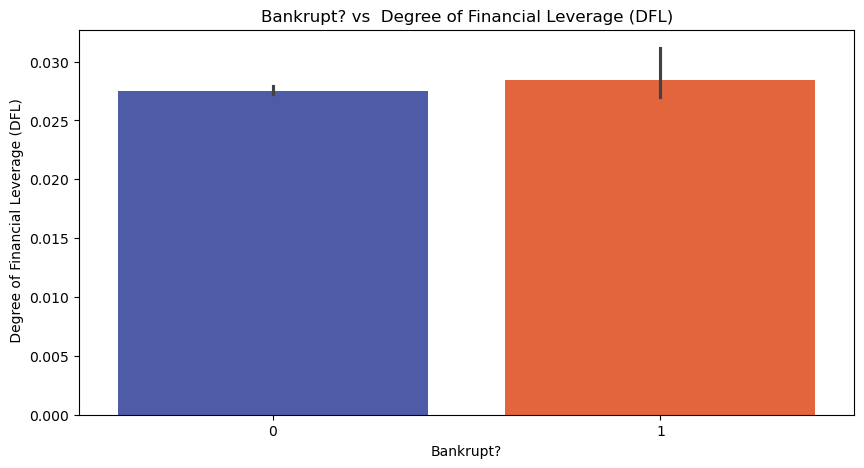

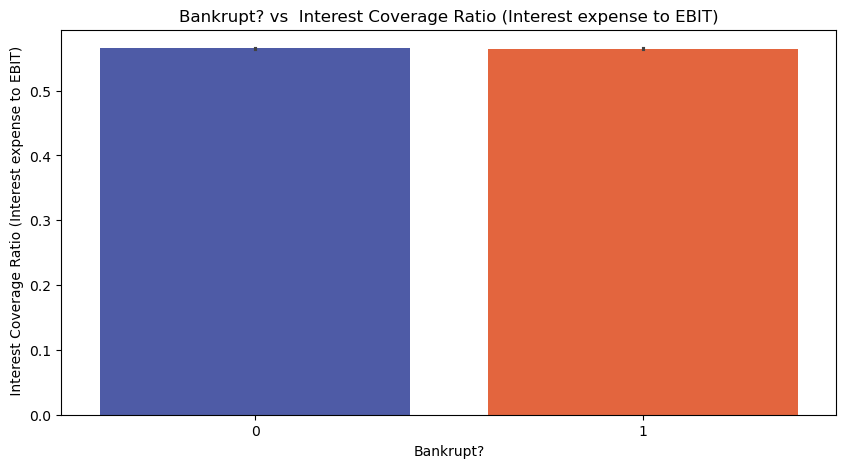

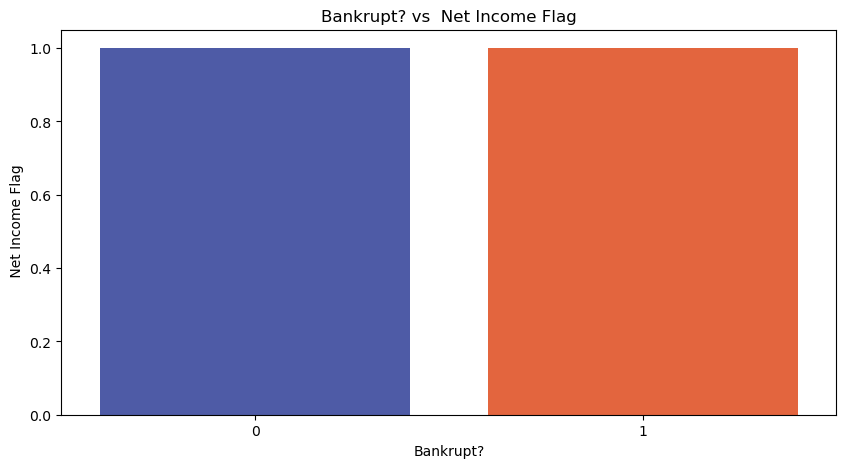

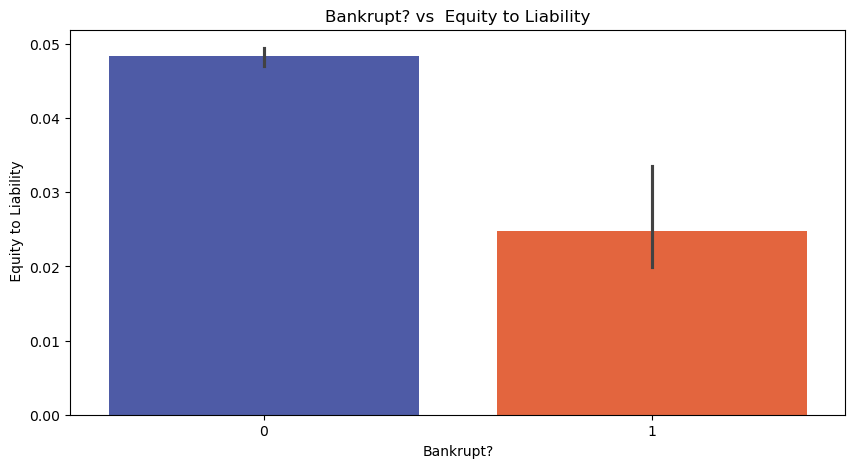

In [14]:

# Understanding the different featues with our target variable by violinplot
for i in list(company_data.describe().columns):
    sns.barplot(x="Bankrupt?", y=i, data=company_data, palette=["#3f51b5", "#ff5722"])
    plt.title("Bankrupt? vs " + i)
    plt.xlabel("Bankrupt?")
    plt.ylabel(i)
    plt.show()

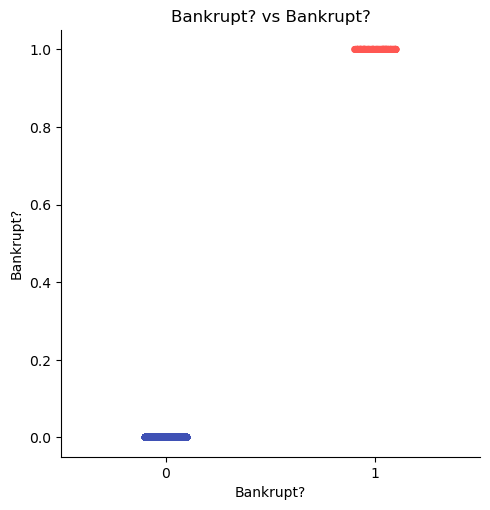

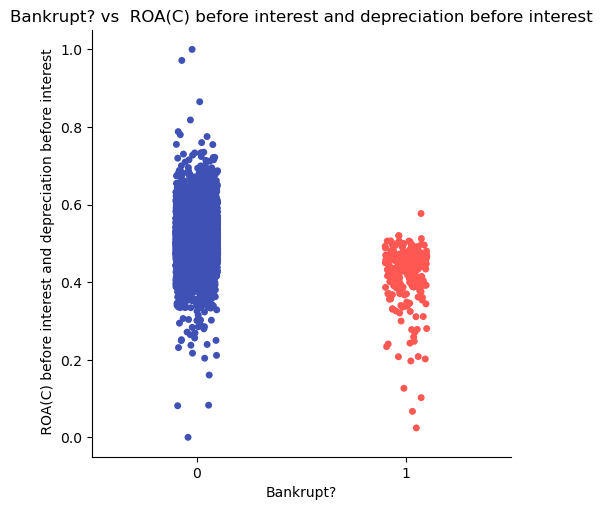

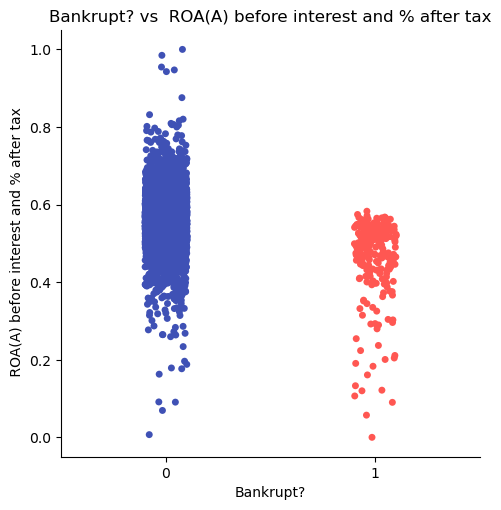

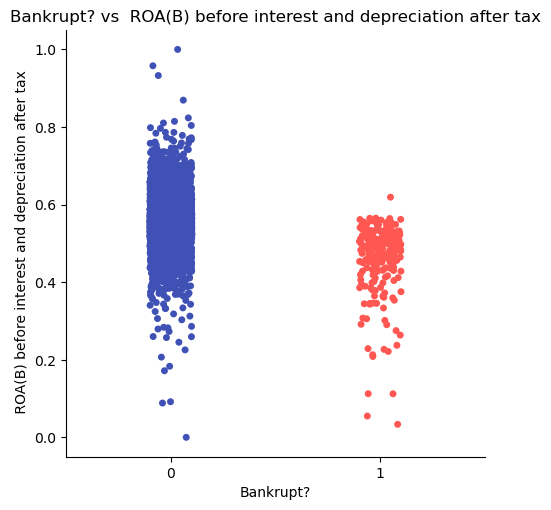

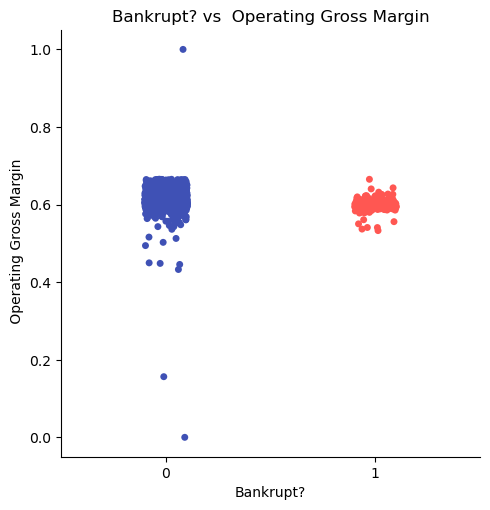

...

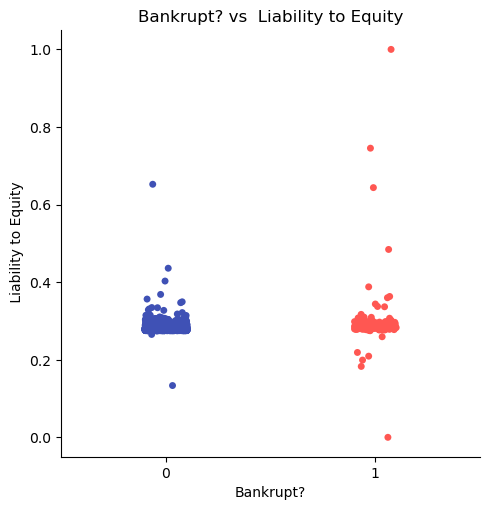

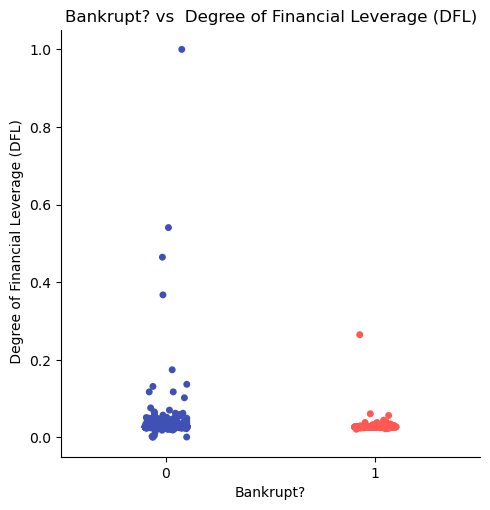

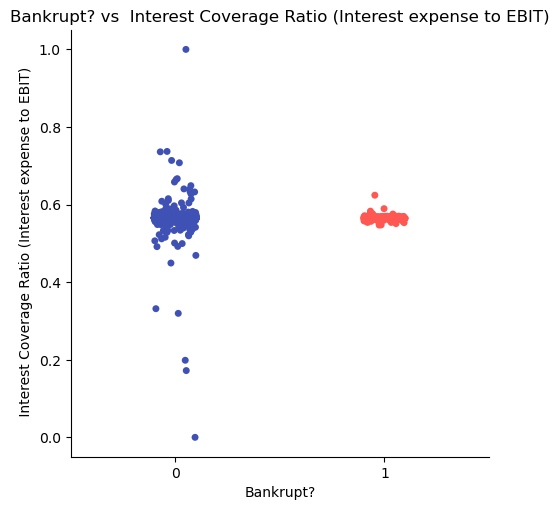

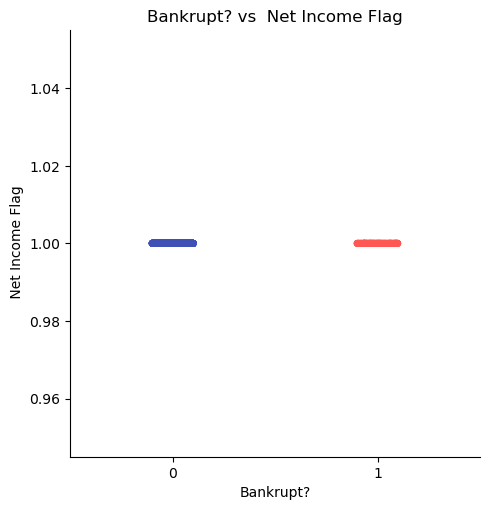

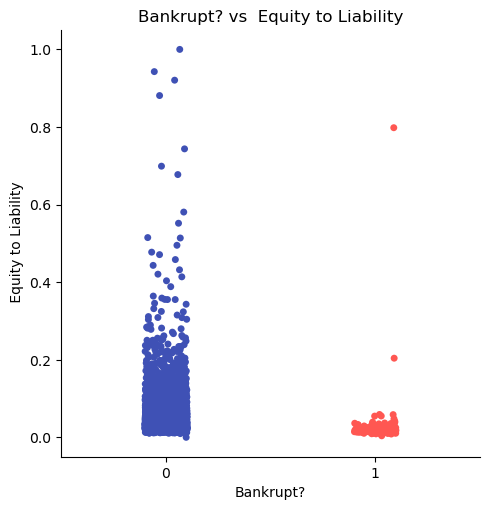

In [15]:
 # Understanding the different featues with our target variable by violinplot
for i in list(company_data.describe().columns):
    sns.catplot(x="Bankrupt?", y=i, data=company_data, palette=["#3f51b5", "#ff5752"])
    plt.title("Bankrupt? vs " + i)
    plt.xlabel("Bankrupt?")
    plt.ylabel(i)
    plt.show()

# Multivariate Analysis

<Axes: >

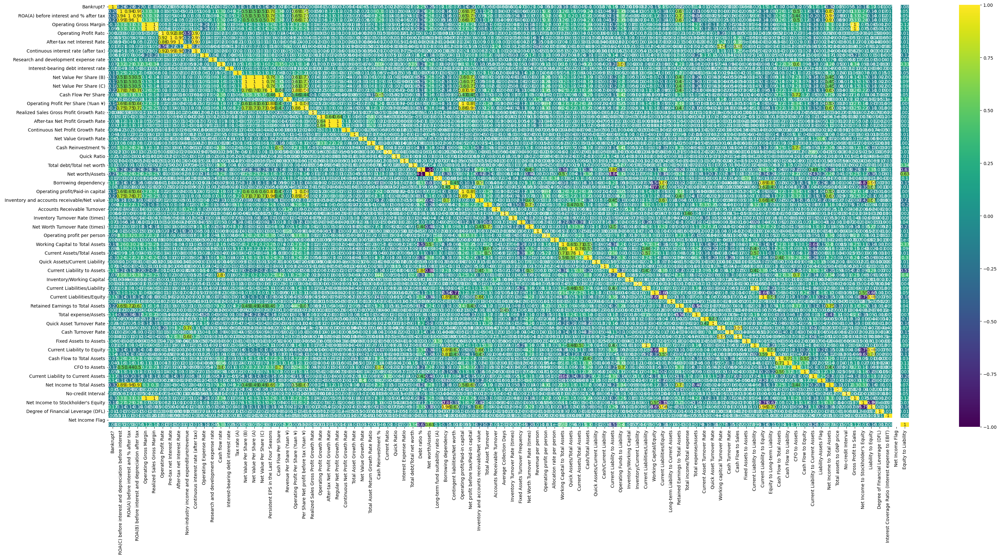

In [16]:
plt.figure(figsize=(40,17))
sns.heatmap(company_data.corr(),annot=True,cmap='viridis')

In [17]:
# Assigning the Target Variable
X=company_data.drop(columns='Bankrupt?',axis=1)
y=company_data['Bankrupt?']

In [18]:
print(X.shape)
print(y.shape)

(6819, 95)
(6819,)


In [19]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [20]:
# checking the rows and columns after splitting the data
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(5114, 95)
(5114,)
(1705, 95)
(1705,)


In [21]:
# scaling the feature 
scaler=MinMaxScaler()
 # fitting with train and test
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

## Model:1. Logistic Regression

In [22]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score,accuracy_score,confusion_matrix,classification_report

In [23]:
model_lg=LogisticRegression()

In [24]:
# fitting the model with training sets
model_lg.fit(X_train,y_train)

LogisticRegression()

In [25]:
y_pred_lg=model_lg.predict(X_test)

In [26]:
y_pred_lg

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [27]:
# Evaluating the metrics
accuracy=accuracy_score(y_test,y_pred_lg)
f1=f1_score(y_test,y_pred_lg)
print(f'Accuracy score is :{accuracy:.2f}')
print(f'f1 score is :{f1:.2f}')

Accuracy score is :0.97
f1 score is :0.18


In [28]:
# understanding the classification report
classfn_rep=classification_report(y_test,y_pred_lg)
print(classfn_rep)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1647
           1       0.86      0.10      0.18        58

    accuracy                           0.97      1705
   macro avg       0.91      0.55      0.58      1705
weighted avg       0.97      0.97      0.96      1705



In [29]:
# Understanding the confusion matrics
confsn_mat=confusion_matrix(y_test,y_pred_lg)
print(confsn_mat)

[[1646    1]
 [  52    6]]


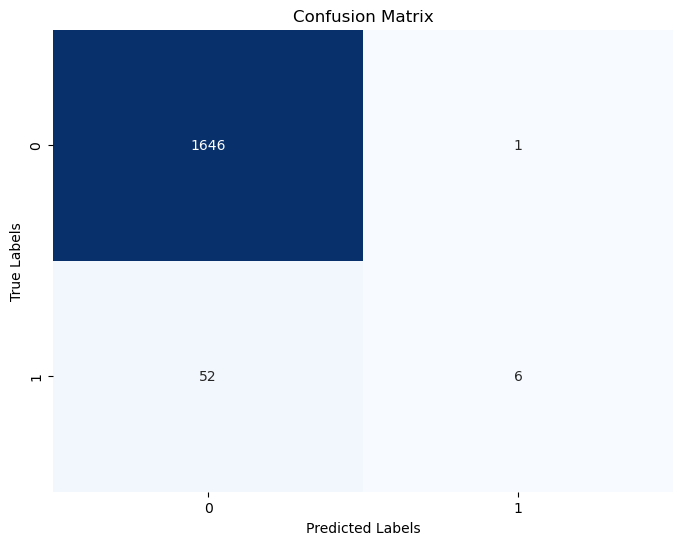

In [30]:
# Create a heatmap with Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confsn_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [31]:
from sklearn.metrics import roc_curve,auc
fpr, tpr, thresholds = roc_curve(y_test, y_pred_lg) # predicting roc and auc curve
roc_auc = auc(fpr, tpr)

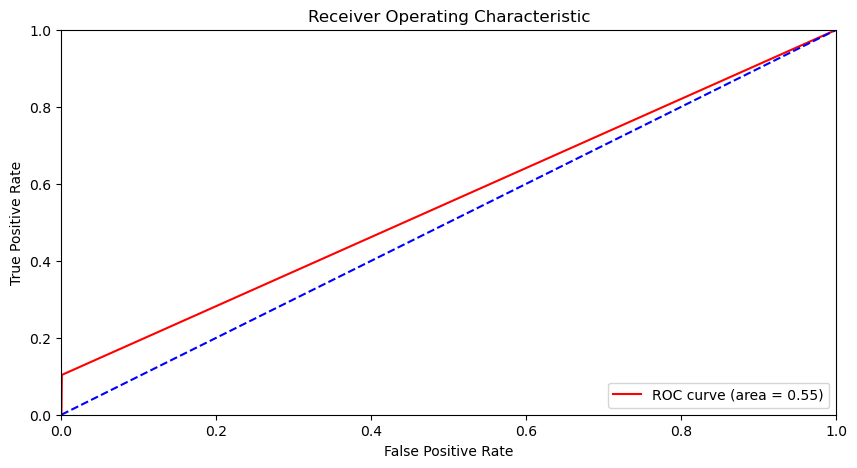

In [32]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(fpr, tpr, color='red', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='blue', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

## Model:2.Random Forest Classifier

In [33]:
from sklearn.ensemble import RandomForestClassifier

In [34]:
model_RFM=RandomForestClassifier(random_state=42)

In [35]:
# Fitting the model
model_RFM.fit(X_train,y_train)

RandomForestClassifier(random_state=42)

In [36]:
y_predit_RFM=model_RFM.predict(X_test)

In [37]:
y_predit_RFM

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [38]:
# Evaluting the metrics
accuracy=accuracy_score(y_test,y_predit_RFM)
# Evaluting the metrics
f1=f1_score(y_test,y_predit_RFM)
print(f'Accuracy Score is :{accuracy:.2f}')
print(f'f1 Score is :{f1:.2f}')

Accuracy Score is :0.97
f1 Score is :0.28


In [39]:
# Evaluting the classification Matix
classfn_rep=classification_report(y_test,y_predit_RFM)
print(classfn_rep)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1647
           1       0.71      0.17      0.28        58

    accuracy                           0.97      1705
   macro avg       0.84      0.58      0.63      1705
weighted avg       0.96      0.97      0.96      1705



[[1643    4]
 [  48   10]]


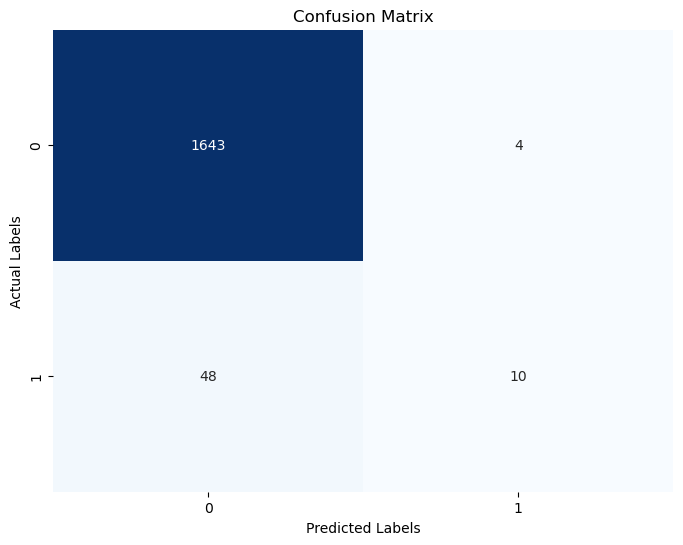

In [40]:
# Evaluating and visualizing the  the confusion matrix
confsn_mat=confusion_matrix(y_test,y_predit_RFM)
print(confsn_mat)

# Visualizing
plt.figure(figsize=(8, 6))
sns.heatmap(confsn_mat, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('Actual Labels')
plt.title('Confusion Matrix')
plt.show()

In [41]:
from sklearn.metrics import roc_curve,auc
fpr, tpr, thresholds = roc_curve(y_test, y_predit_RFM) # predicting roc and auc curve
roc_auc = auc(fpr, tpr)

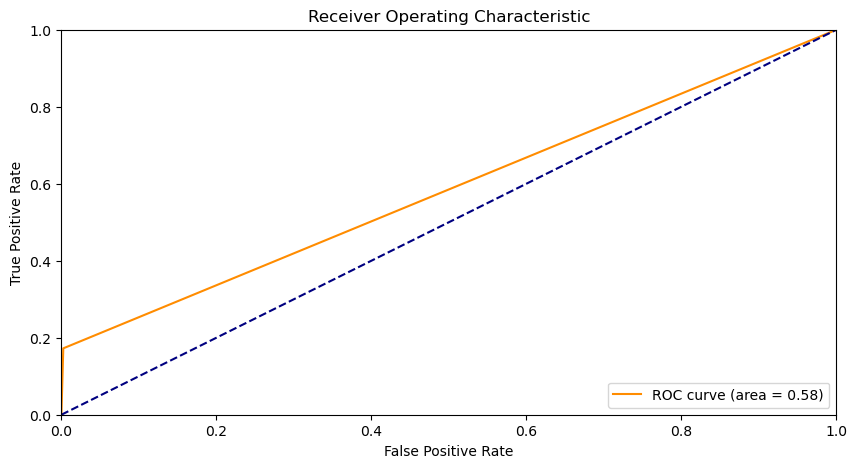

In [42]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [45]:
import pickle

In [46]:
# Save the model to a file
with open('model.pkl', 'wb') as file:
    pickle.dump(model_RFM, file)

In [43]:
import os
current_directory = os.getcwd()
print(current_directory)


C:\Users\Lenovo\Desktop\COMPANY BANKRUPTCY PREDICTION CAPSTONE


In [53]:
import joblib

# Save the model to a file
joblib.dump(model_RFM, 'model_jlib.joblib')


['model_jlib.joblib']

In [49]:
#READING THE MODEL
import pickle

# Load the pickled object from the file
with open('model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)


In [50]:
loaded_model

RandomForestClassifier(random_state=42)

In [51]:
y_pred_bankrupt=loaded_model.predict(X_test)

In [52]:
y_pred_bankrupt

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [66]:
import joblib

# Load the saved model
bankru_model = joblib.load('model_jlib.joblib')


In [55]:
y_pred_bank_jon=bankru_model.predict(X_test)

In [56]:
y_pred_bank_jon

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [60]:
X_test.shape

(1705, 95)

In [61]:
df_X_test=pd.DataFrame(X_test)

In [68]:
df_X_test.to_csv("df_xtest.csv",index_label=False)

In [69]:
load_test_file=pd.read_csv('df_xtest.csv')

In [70]:
load_test_file_array=np.array(load_test_file)

In [71]:
y_pred=bankru_model.predict(load_test_file_array)

In [72]:
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

## Performimg gridSearch HyperParameter Tuning

In [81]:
# from sklearn.model_selection import GridSearchCV

In [ ]:
# # Define the parameter grid
# param_grid = {'n_estimators': [100, 200, 500],  # Adjust the number of trees
#               'max_depth': [5, 10, 20],        # Adjust the tree depth
#               'min_samples_split': [2, 5, 10]}  # Adjust minimum samples per split
# grid_search = GridSearchCV(estimator=model_RFM, param_grid=param_grid, cv=5, scoring='accuracy')
# grid_search.fit(X_train, y_train)

## Getting the best Hyperparameters

In [ ]:
# best_params = grid_search.best_params_

## Training the Random Forest Classifier With Best Hyperparameters

In [ ]:
# best_clf = (random_state=42, **best_params)
# best_clf.fit(X_train, y_train)

## Predict with tuned Model

In [ ]:
# y_pred_tuned = best_clf.predict(X_test)


## Evaluate the Tuned MOdel

In [ ]:
# accuracy_tuned = accuracy_score(y_test, y_pred_tuned)
# print("\nGrid Search Results:")
# print(f"Best Hyperparameters: {best_params}")
# print(f"Test Set Accuracy with Tuned Model: {accuracy_tuned:.2f}")